# Data set creation
In this notebook, I prepared Sentinel-2 satellite images train, dev and test datasets.

link in Sentinel Hub: https://www.sentinel-hub.com/index.html

In [2]:
# Jupyter magic commands
%reload_ext autoreload
%autoreload 2
%matplotlib inline

# import libraries
import datetime
import os
import matplotlib.pyplot as plt
import numpy as np
from sentinelhub import SHConfig

from PIL import Image, ImageEnhance

from sentinelhub import (
    CRS,
    BBox,
    DataCollection,
    DownloadRequest,
    MimeType,
    MosaickingOrder,
    SentinelHubDownloadClient,
    SentinelHubRequest,
    bbox_to_dimensions,
)

# Enter credentials from Sentinel Hub. I removed my personal CLIENT_ID and CLIENT_SECRET after running the notebook
CLIENT_ID = ""
CLIENT_SECRET = ""

#### Preparing a requests.

In [3]:
# configurations for accessing Sentinel Hub services.
config = SHConfig()

if CLIENT_ID and CLIENT_SECRET:
    config.sh_client_id = CLIENT_ID
    config.sh_client_secret = CLIENT_SECRET
    
if config.sh_client_id == "" or config.sh_client_secret =="":
    print("Warning! Provide credentials")

In [4]:
# Provide the desired image coordinates and resolution. Check the output image size. The maximum size is 2500x2500.

resolution = 10

block_01_coords_wgs84 = (23.458556, 49.280572, 23.814656, 49.497401)
block_01_bbox = BBox(bbox=block_01_coords_wgs84, crs=CRS.WGS84)
block_01_size = bbox_to_dimensions(block_01_bbox, resolution=resolution)

block_02_coords_wgs84 = (23.836229, 49.470801, 24.167901, 49.704302)
block_02_bbox = BBox(bbox=block_02_coords_wgs84, crs=CRS.WGS84)
block_02_size = bbox_to_dimensions(block_02_bbox, resolution=resolution)

block_03_coords_wgs84 = (22.87778, 48.356249, 23.224852, 48.574981)
block_03_bbox = BBox(bbox=block_03_coords_wgs84, crs=CRS.WGS84)
block_03_size = bbox_to_dimensions(block_03_bbox, resolution=resolution)

block_04_coords_wgs84 = (24.168551, 49.273629, 24.500511, 49.506201)
block_04_bbox = BBox(bbox=block_04_coords_wgs84, crs=CRS.WGS84)
block_04_size = bbox_to_dimensions(block_04_bbox, resolution=resolution)

block_05_coords_wgs84 = (24.494711, 49.081962, 24.826918, 49.313609)
block_05_bbox = BBox(bbox=block_05_coords_wgs84, crs=CRS.WGS84)
block_05_size = bbox_to_dimensions(block_05_bbox, resolution=resolution)

block_06_coords_wgs84 = (25.499584, 49.281244, 25.838, 49.51)
block_06_bbox = BBox(bbox=block_06_coords_wgs84, crs=CRS.WGS84)
block_06_size = bbox_to_dimensions(block_06_bbox, resolution=resolution)

block_07_coords_wgs84 = (25.957264, 49.266908, 26.297636, 49.49435)
block_07_bbox = BBox(bbox=block_07_coords_wgs84, crs=CRS.WGS84)
block_07_size = bbox_to_dimensions(block_07_bbox, resolution=resolution)

block_08_coords_wgs84 = (26.301271, 49.266908, 26.643304, 49.49333)
block_08_bbox = BBox(bbox=block_08_coords_wgs84, crs=CRS.WGS84)
block_08_size = bbox_to_dimensions(block_08_bbox, resolution=resolution)

block_09_coords_wgs84 = (25.971681, 48.934229, 26.309865, 49.161614)
block_09_bbox = BBox(bbox=block_09_coords_wgs84, crs=CRS.WGS84)
block_09_size = bbox_to_dimensions(block_09_bbox, resolution=resolution)

block_10_coords_wgs84 = (26.730418, 48.763431, 27.070931, 48.988616)
block_10_bbox = BBox(bbox=block_10_coords_wgs84, crs=CRS.WGS84)
block_10_size = bbox_to_dimensions(block_10_bbox, resolution=resolution)

print(f"Image shape of 'block_01' at {resolution} m resolution: {block_01_size} pixels")
print(f"Image shape of 'block_02' at {resolution} m resolution: {block_02_size} pixels")
print(f"Image shape of 'block_03' at {resolution} m resolution: {block_03_size} pixels")
print(f"Image shape of 'block_04' at {resolution} m resolution: {block_04_size} pixels")
print(f"Image shape of 'block_05' at {resolution} m resolution: {block_05_size} pixels")
print(f"Image shape of 'block_06' at {resolution} m resolution: {block_06_size} pixels")
print(f"Image shape of 'block_07' at {resolution} m resolution: {block_07_size} pixels")
print(f"Image shape of 'block_08' at {resolution} m resolution: {block_08_size} pixels")
print(f"Image shape of 'block_09' at {resolution} m resolution: {block_09_size} pixels")
print(f"Image shape of 'block_10' at {resolution} m resolution: {block_10_size} pixels")

Image shape of 'block_01' at 10 m resolution: (2500, 2500) pixels
Image shape of 'block_02' at 10 m resolution: (2500, 2500) pixels
Image shape of 'block_03' at 10 m resolution: (2500, 2500) pixels
Image shape of 'block_04' at 10 m resolution: (2500, 2500) pixels
Image shape of 'block_05' at 10 m resolution: (2500, 2500) pixels
Image shape of 'block_06' at 10 m resolution: (2500, 2500) pixels
Image shape of 'block_07' at 10 m resolution: (2500, 2500) pixels
Image shape of 'block_08' at 10 m resolution: (2500, 2500) pixels
Image shape of 'block_09' at 10 m resolution: (2500, 2500) pixels
Image shape of 'block_10' at 10 m resolution: (2500, 2500) pixels


In [5]:
# Configure a request to Sentinel Hub to retrieve an image block based on certain parameters

evalscript = """
    //VERSION=3

    function setup() {
        return {
            input: [{
                bands: ["B02", "B03", "B04"]
            }],
            output: {
                bands: 3
            }
        };
    }

    function evaluatePixel(sample) {
        return [sample.B04, sample.B03, sample.B02];
    }
"""

def get_image_block(block_bbox, block_size, start_date, end_date, config=config, evalscript=evalscript):
    """
    Creates a request for a specific image block from Sentinel Hub based on provided parameters.

    Arguments:
    - block_bbox (BBox): Represents the bounding box (geographical area) for which the image block is requested.
    - block_size (tuple): Specifies the size (dimensions) of the image block to be retrieved.
    - start_date (str): The start date of the time interval for which the data is requested (format: 'YYYY-MM-DD').
    - end_date (str): The end date of the time interval for which the data is requested (format: 'YYYY-MM-DD').
    - config (SHConfig, optional): Configuration settings for accessing Sentinel Hub services. 
      Defaults to the previously defined `config` object.
    - evalscript (str, optional): The script used for data processing and transformation. 
      Defaults to the previously defined `evalscript`.

    Returns:
    - request_block (SentinelHubRequest): Represents the configured request object used to 
      retrieve the image block from Sentinel Hub.
    """
    request_block = SentinelHubRequest(
        evalscript=evalscript,
        input_data=[
            SentinelHubRequest.input_data(
                data_collection=DataCollection.SENTINEL2_L1C,
                time_interval=(start_date, end_date),
                mosaicking_order=MosaickingOrder.LEAST_CC,
            )
        ],
        responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
        bbox=block_bbox,
        size=block_size,
        config=config,
    )
    
    return request_block

def corrected_image(img_array):
    """
    Enhances the brightness of an image represented as a NumPy array.

    Arguments:
    - img_array (numpy.ndarray): Input image as a NumPy array.

    Returns:
    - brightened_array (numpy.ndarray): Brightened image array resulting from enhancing the brightness 
      of the input image by a factor of 3.2 (adjustable).
    """
    pil_img = Image.fromarray(img_array)
    enhancer = ImageEnhance.Brightness(pil_img)
    brightened_img = enhancer.enhance(3.2)
    brightened_array = np.array(brightened_img)
        
    return brightened_array

In [6]:
# Request the satellite image block-1 for all four seasons
request_block_01_winter = get_image_block(
    block_bbox=block_01_bbox, 
    block_size=block_01_size, 
    start_date="2018-01-01", 
    end_date="2018-02-01")

request_block_01_spring = get_image_block(
    block_bbox=block_01_bbox, 
    block_size=block_01_size, 
    start_date="2022-03-01", 
    end_date="2022-04-01")

request_block_01_summer = get_image_block(
    block_bbox=block_01_bbox, 
    block_size=block_01_size, 
    start_date="2022-06-01", 
    end_date="2022-07-01")

request_block_01_autumn = get_image_block(
    block_bbox=block_01_bbox, 
    block_size=block_01_size, 
    start_date="2021-09-01", 
    end_date="2021-10-01")

The next four cells below perform requests to Sentinel Hub for each season

In [7]:
block_01_winter_img = request_block_01_winter.get_data()

In [8]:
block_01_spring_img = request_block_01_spring.get_data()

In [9]:
block_01_summer_img = request_block_01_summer.get_data()

In [10]:
block_01_autumn_img = request_block_01_autumn.get_data()

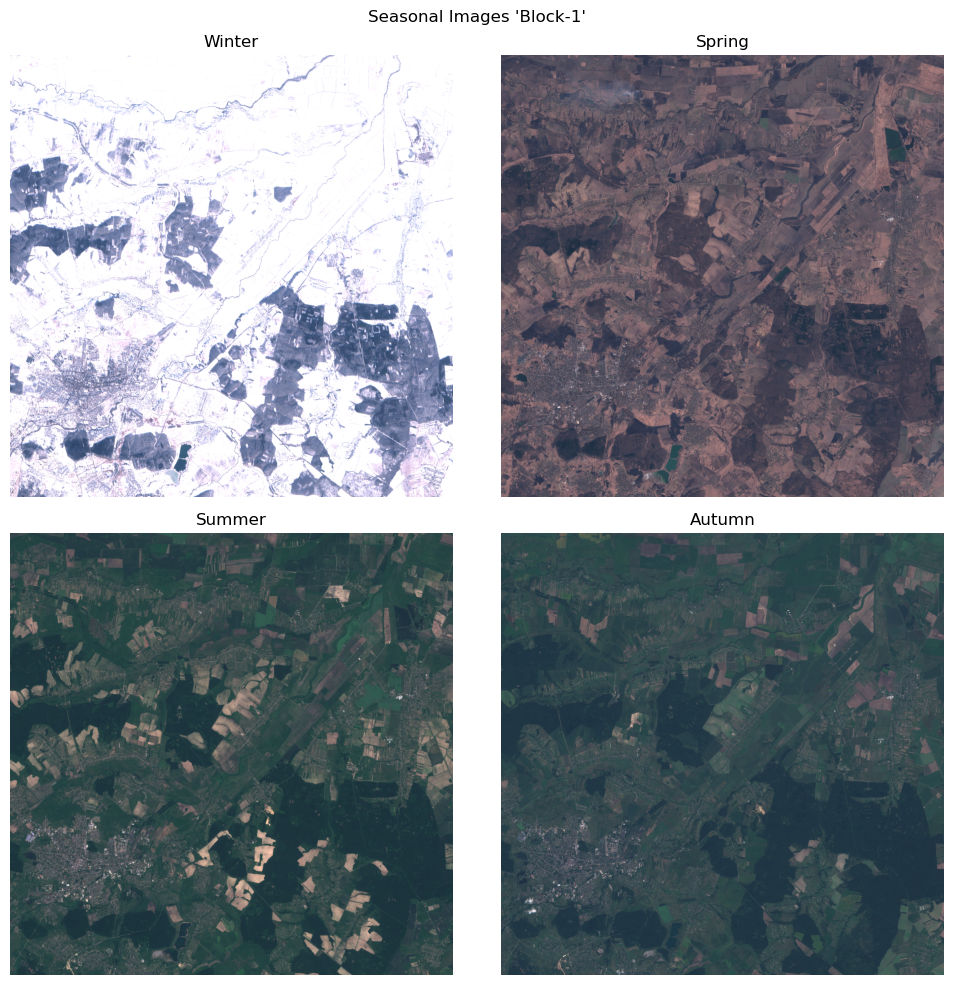

In [11]:
# Plot the received satellite images
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))

block_01_winter_img_prep = corrected_image(block_01_winter_img[0])
block_01_spring_img_prep = corrected_image(block_01_spring_img[0])
block_01_summer_img_prep = corrected_image(block_01_summer_img[0])
block_01_autumn_img_prep = corrected_image(block_01_autumn_img[0])

axes[0, 0].imshow(block_01_winter_img_prep)
axes[0, 0].set_title('Winter')
axes[0, 0].axis('off')

axes[0, 1].imshow(block_01_spring_img_prep)
axes[0, 1].set_title('Spring')
axes[0, 1].axis('off')

axes[1, 0].imshow(block_01_summer_img_prep)
axes[1, 0].set_title('Summer')
axes[1, 0].axis('off')

axes[1, 1].imshow(block_01_autumn_img_prep)
axes[1, 1].set_title('Autumn')
axes[1, 1].axis('off')

plt.suptitle("Seasonal Images 'Block-1'")
plt.tight_layout()

In [12]:
# Request the satellite image block-2 for all four seasons
request_block_02_winter = get_image_block(
    block_bbox=block_02_bbox, 
    block_size=block_02_size, 
    start_date="2017-01-01", 
    end_date="2017-02-01")

request_block_02_spring = get_image_block(
    block_bbox=block_02_bbox, 
    block_size=block_02_size, 
    start_date="2022-03-01", 
    end_date="2022-04-01")

request_block_02_summer = get_image_block(
    block_bbox=block_02_bbox, 
    block_size=block_02_size, 
    start_date="2022-06-01", 
    end_date="2022-07-01")

request_block_02_autumn = get_image_block(
    block_bbox=block_02_bbox, 
    block_size=block_02_size, 
    start_date="2022-10-01", 
    end_date="2022-11-01")

The next four cells below perform requests to Sentinel Hub for each season

In [13]:
block_02_winter_img = request_block_02_winter.get_data()

In [14]:
block_02_spring_img = request_block_02_spring.get_data()

In [15]:
block_02_summer_img = request_block_02_summer.get_data()

In [16]:
block_02_autumn_img = request_block_02_autumn.get_data()

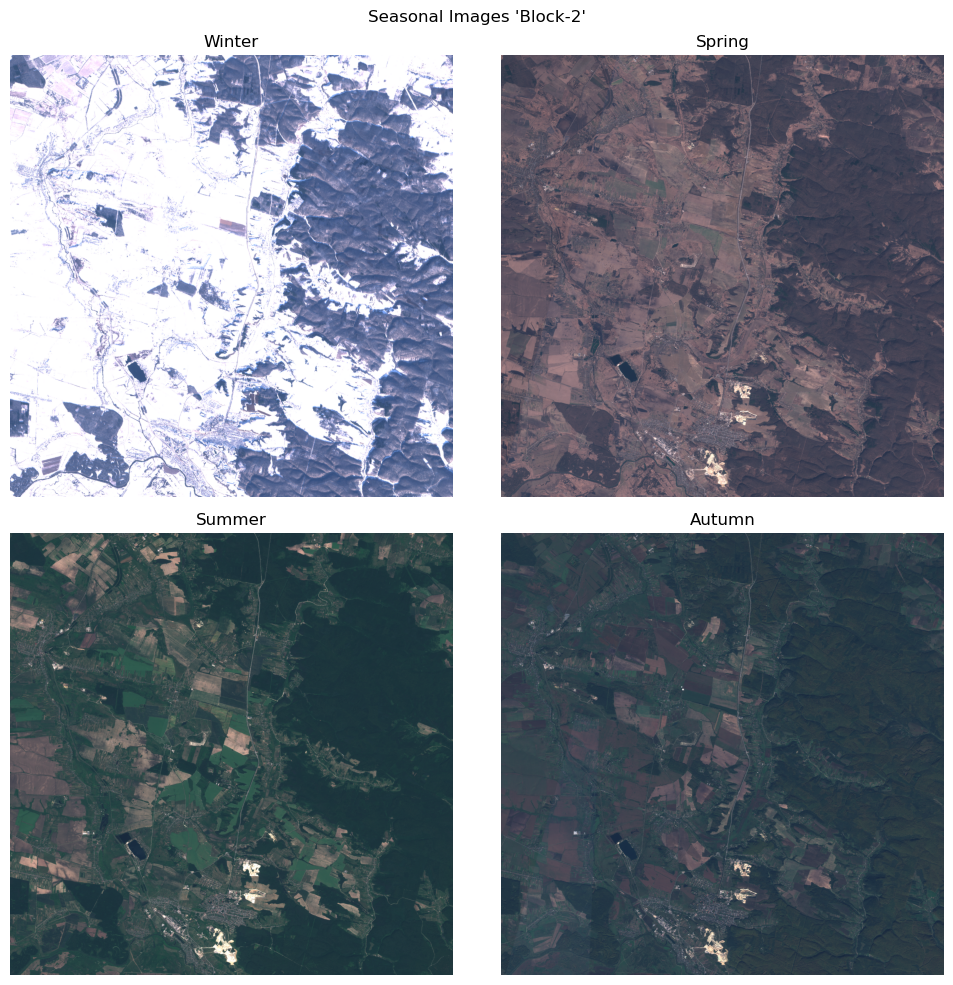

In [17]:
# Plot the received satellite images
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10)) 

block_02_winter_img_prep = corrected_image(block_02_winter_img[0])
block_02_spring_img_prep = corrected_image(block_02_spring_img[0])
block_02_summer_img_prep = corrected_image(block_02_summer_img[0])
block_02_autumn_img_prep = corrected_image(block_02_autumn_img[0])

axes[0, 0].imshow(block_02_winter_img_prep)
axes[0, 0].set_title('Winter')
axes[0, 0].axis('off')

axes[0, 1].imshow(block_02_spring_img_prep)
axes[0, 1].set_title('Spring')
axes[0, 1].axis('off')

axes[1, 0].imshow(block_02_summer_img_prep)
axes[1, 0].set_title('Summer')
axes[1, 0].axis('off')

axes[1, 1].imshow(block_02_autumn_img_prep)
axes[1, 1].set_title('Autumn')
axes[1, 1].axis('off')

plt.suptitle("Seasonal Images 'Block-2'")
plt.tight_layout()

In [18]:
# Request the satellite image block-3 for all four seasons
request_block_03_winter = get_image_block(
    block_bbox=block_03_bbox, 
    block_size=block_03_size, 
    start_date="2018-01-01", 
    end_date="2018-02-01")

request_block_03_spring = get_image_block(
    block_bbox=block_03_bbox, 
    block_size=block_03_size, 
    start_date="2022-03-01", 
    end_date="2022-04-01")

request_block_03_summer = get_image_block(
    block_bbox=block_03_bbox, 
    block_size=block_03_size, 
    start_date="2022-06-01", 
    end_date="2022-07-01")

request_block_03_autumn = get_image_block(
    block_bbox=block_03_bbox, 
    block_size=block_03_size, 
    start_date="2021-10-01", 
    end_date="2021-11-01")

The next four cells below perform requests to Sentinel Hub for each season

In [19]:
block_03_winter_img = request_block_03_winter.get_data()

In [20]:
block_03_spring_img = request_block_03_spring.get_data()

In [21]:
block_03_summer_img = request_block_03_summer.get_data()

In [22]:
block_03_autumn_img = request_block_03_autumn.get_data()

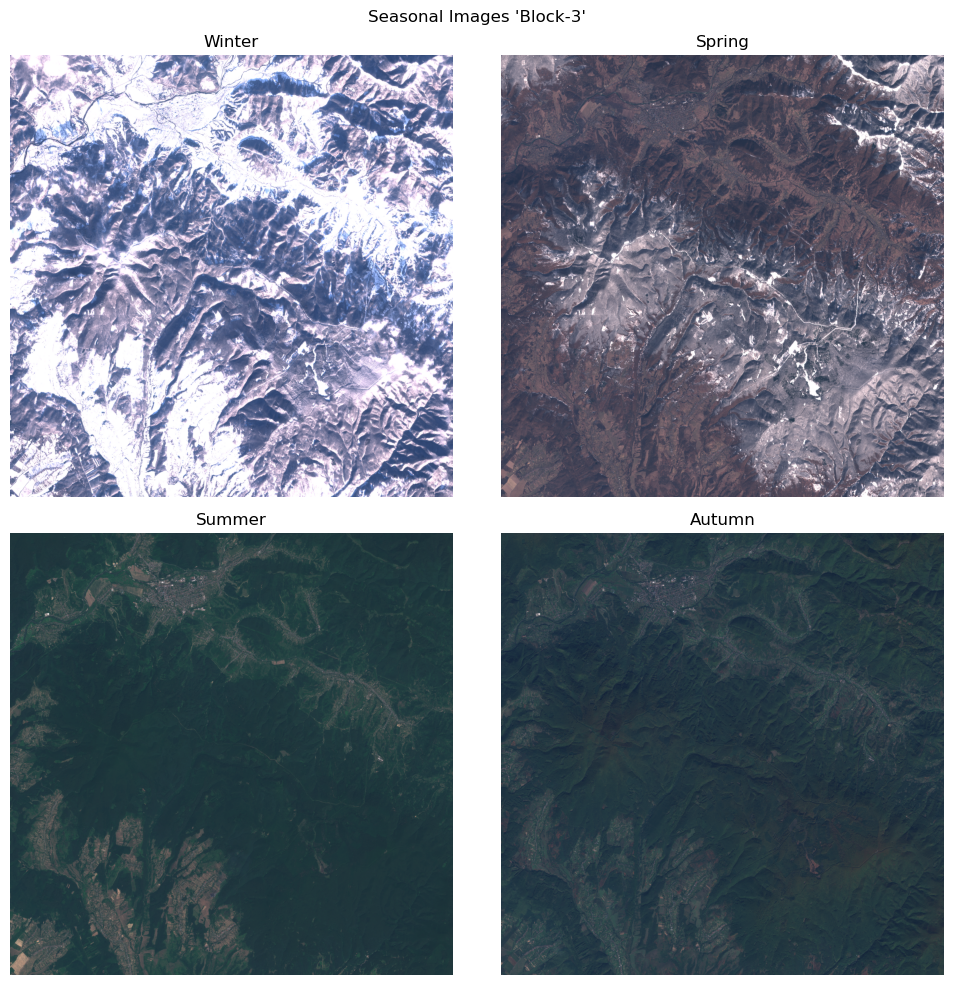

In [23]:
# Plot the received satellite images
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10)) 

block_03_winter_img_prep = corrected_image(block_03_winter_img[0])
block_03_spring_img_prep = corrected_image(block_03_spring_img[0])
block_03_summer_img_prep = corrected_image(block_03_summer_img[0])
block_03_autumn_img_prep = corrected_image(block_03_autumn_img[0])

axes[0, 0].imshow(block_03_winter_img_prep)
axes[0, 0].set_title('Winter')
axes[0, 0].axis('off')

axes[0, 1].imshow(block_03_spring_img_prep)
axes[0, 1].set_title('Spring')
axes[0, 1].axis('off')

axes[1, 0].imshow(block_03_summer_img_prep)
axes[1, 0].set_title('Summer')
axes[1, 0].axis('off')

axes[1, 1].imshow(block_03_autumn_img_prep)
axes[1, 1].set_title('Autumn')
axes[1, 1].axis('off')

plt.suptitle("Seasonal Images 'Block-3'")
plt.tight_layout()

In [24]:
# Request the satellite image block-4 for all four seasons
request_block_04_winter = get_image_block(
    block_bbox=block_04_bbox, 
    block_size=block_04_size, 
    start_date="2017-01-01", 
    end_date="2017-02-01")

request_block_04_spring = get_image_block(
    block_bbox=block_04_bbox, 
    block_size=block_04_size, 
    start_date="2022-03-01", 
    end_date="2022-04-01")

request_block_04_summer = get_image_block(
    block_bbox=block_04_bbox, 
    block_size=block_04_size, 
    start_date="2022-06-01", 
    end_date="2022-07-01")

request_block_04_autumn = get_image_block(
    block_bbox=block_04_bbox, 
    block_size=block_04_size, 
    start_date="2021-10-01", 
    end_date="2021-11-01")

The next four cells below perform requests to Sentinel Hub for each season

In [25]:
block_04_winter_img = request_block_04_winter.get_data()

In [26]:
block_04_spring_img = request_block_04_spring.get_data()

In [27]:
block_04_summer_img = request_block_04_summer.get_data()

In [28]:
block_04_autumn_img = request_block_04_autumn.get_data()

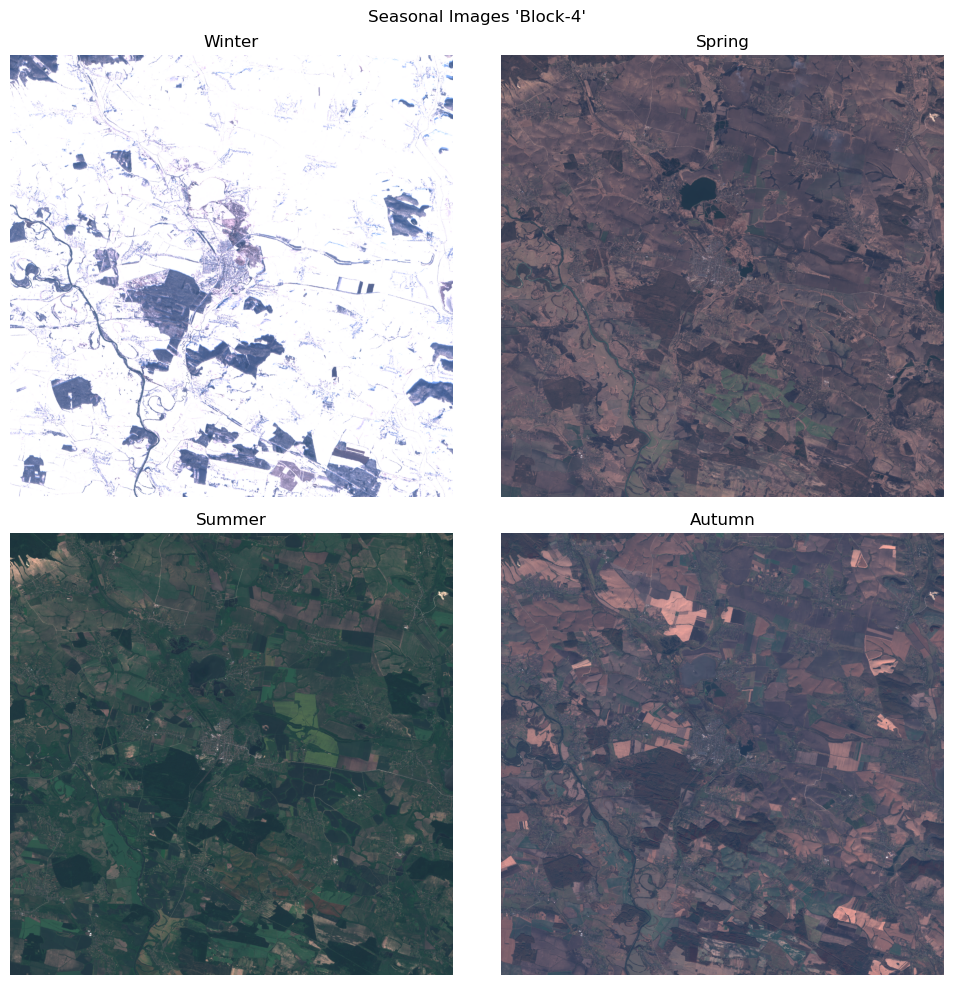

In [29]:
# Plot the received satellite images
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))

block_04_winter_img_prep = corrected_image(block_04_winter_img[0])
block_04_spring_img_prep = corrected_image(block_04_spring_img[0])
block_04_summer_img_prep = corrected_image(block_04_summer_img[0])
block_04_autumn_img_prep = corrected_image(block_04_autumn_img[0])

axes[0, 0].imshow(block_04_winter_img_prep)
axes[0, 0].set_title('Winter')
axes[0, 0].axis('off')

axes[0, 1].imshow(block_04_spring_img_prep)
axes[0, 1].set_title('Spring')
axes[0, 1].axis('off')

axes[1, 0].imshow(block_04_summer_img_prep)
axes[1, 0].set_title('Summer')
axes[1, 0].axis('off')

axes[1, 1].imshow(block_04_autumn_img_prep)
axes[1, 1].set_title('Autumn')
axes[1, 1].axis('off')

plt.suptitle("Seasonal Images 'Block-4'")
plt.tight_layout()

In [30]:
# Request the satellite image block-5 for all four seasons
request_block_05_winter = get_image_block(
    block_bbox=block_05_bbox, 
    block_size=block_05_size, 
    start_date="2017-01-01", 
    end_date="2017-02-01")

request_block_05_spring = get_image_block(
    block_bbox=block_05_bbox, 
    block_size=block_05_size, 
    start_date="2022-03-01", 
    end_date="2022-04-01")

request_block_05_summer = get_image_block(
    block_bbox=block_05_bbox, 
    block_size=block_05_size, 
    start_date="2022-06-01", 
    end_date="2022-07-01")

request_block_05_autumn = get_image_block(
    block_bbox=block_05_bbox, 
    block_size=block_05_size, 
    start_date="2021-10-01", 
    end_date="2021-11-01")

The next four cells below perform requests to Sentinel Hub for each season

In [31]:
block_05_winter_img = request_block_05_winter.get_data()

In [32]:
block_05_spring_img = request_block_05_spring.get_data()

In [33]:
block_05_summer_img = request_block_05_summer.get_data()

In [34]:
block_05_autumn_img = request_block_05_autumn.get_data()

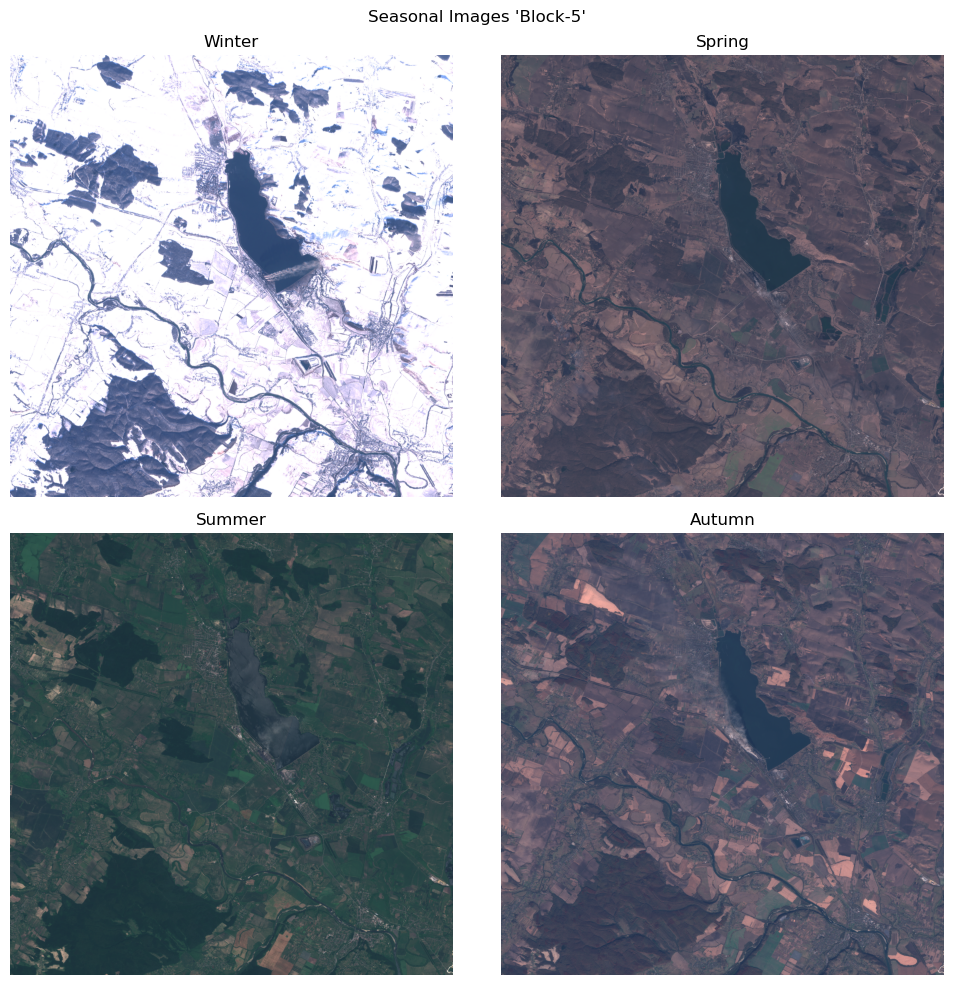

In [35]:
# Plot the received satellite images
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))

block_05_winter_img_prep = corrected_image(block_05_winter_img[0])
block_05_spring_img_prep = corrected_image(block_05_spring_img[0])
block_05_summer_img_prep = corrected_image(block_05_summer_img[0])
block_05_autumn_img_prep = corrected_image(block_05_autumn_img[0])

axes[0, 0].imshow(block_05_winter_img_prep)
axes[0, 0].set_title('Winter')
axes[0, 0].axis('off')

axes[0, 1].imshow(block_05_spring_img_prep)
axes[0, 1].set_title('Spring')
axes[0, 1].axis('off')

axes[1, 0].imshow(block_05_summer_img_prep)
axes[1, 0].set_title('Summer')
axes[1, 0].axis('off')

axes[1, 1].imshow(block_05_autumn_img_prep)
axes[1, 1].set_title('Autumn')
axes[1, 1].axis('off')

plt.suptitle("Seasonal Images 'Block-5'")
plt.tight_layout()

In [36]:
# Request the satellite image block-6 for all four seasons
request_block_06_winter = get_image_block(
    block_bbox=block_06_bbox, 
    block_size=block_06_size, 
    start_date="2019-01-01", 
    end_date="2019-02-01")

request_block_06_spring = get_image_block(
    block_bbox=block_06_bbox, 
    block_size=block_06_size, 
    start_date="2022-03-01", 
    end_date="2022-04-01")

request_block_06_summer = get_image_block(
    block_bbox=block_06_bbox, 
    block_size=block_06_size, 
    start_date="2021-07-01", 
    end_date="2021-08-01")

request_block_06_autumn = get_image_block(
    block_bbox=block_06_bbox, 
    block_size=block_06_size, 
    start_date="2021-10-01", 
    end_date="2021-11-01")

The next four cells below perform requests to Sentinel Hub for each season

In [37]:
block_06_winter_img = request_block_06_winter.get_data()

In [38]:
block_06_spring_img = request_block_06_spring.get_data()

In [39]:
block_06_summer_img = request_block_06_summer.get_data()

In [40]:
block_06_autumn_img = request_block_06_autumn.get_data()

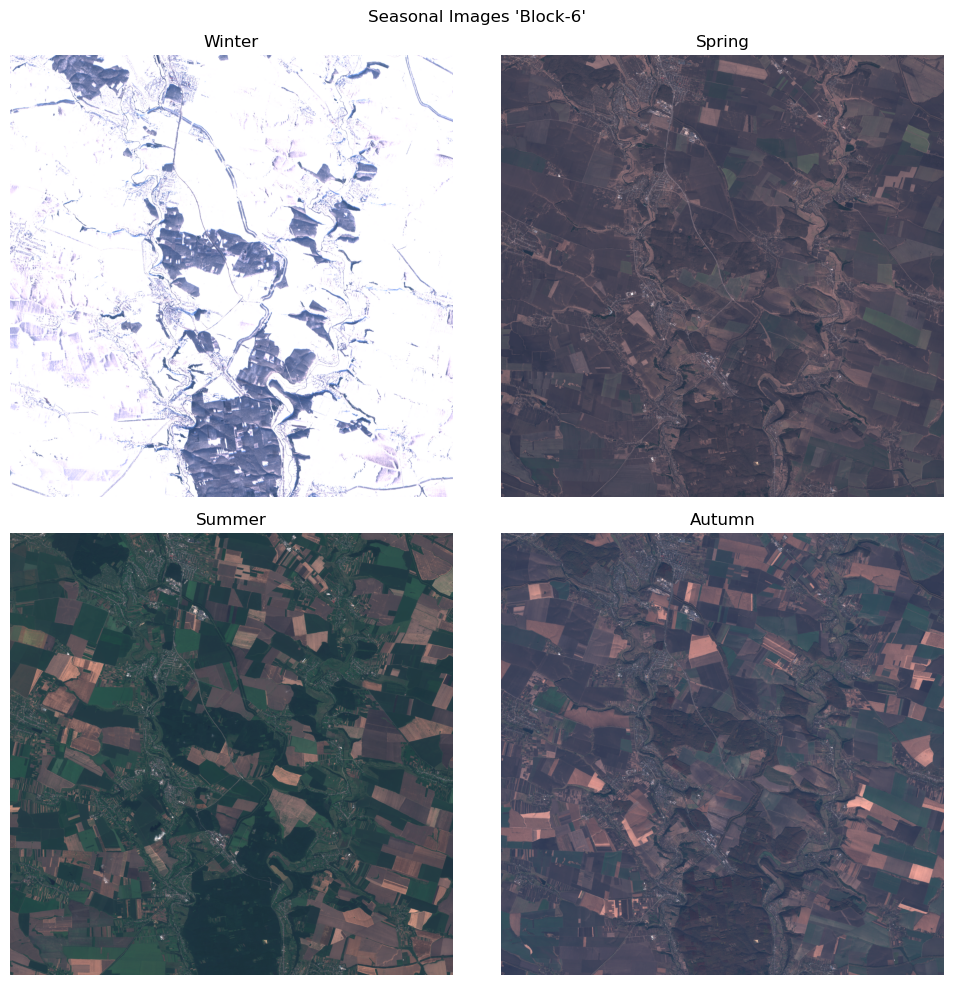

In [41]:
# Plot the received satellite images
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))

block_06_winter_img_prep = corrected_image(block_06_winter_img[0])
block_06_spring_img_prep = corrected_image(block_06_spring_img[0])
block_06_summer_img_prep = corrected_image(block_06_summer_img[0])
block_06_autumn_img_prep = corrected_image(block_06_autumn_img[0])

axes[0, 0].imshow(block_06_winter_img_prep)
axes[0, 0].set_title('Winter')
axes[0, 0].axis('off')

axes[0, 1].imshow(block_06_spring_img_prep)
axes[0, 1].set_title('Spring')
axes[0, 1].axis('off')

axes[1, 0].imshow(block_06_summer_img_prep)
axes[1, 0].set_title('Summer')
axes[1, 0].axis('off')

axes[1, 1].imshow(block_06_autumn_img_prep)
axes[1, 1].set_title('Autumn')
axes[1, 1].axis('off')

plt.suptitle("Seasonal Images 'Block-6'")
plt.tight_layout()

In [42]:
# Request the satellite image block-7 for all four seasons
request_block_07_winter = get_image_block(
    block_bbox=block_07_bbox, 
    block_size=block_07_size, 
    start_date="2018-01-01", 
    end_date="2018-02-01")

request_block_07_spring = get_image_block(
    block_bbox=block_07_bbox, 
    block_size=block_07_size, 
    start_date="2022-03-01", 
    end_date="2022-04-01")

request_block_07_summer = get_image_block(
    block_bbox=block_07_bbox, 
    block_size=block_07_size, 
    start_date="2022-06-01", 
    end_date="2022-07-01")

request_block_07_autumn = get_image_block(
    block_bbox=block_07_bbox, 
    block_size=block_07_size, 
    start_date="2021-10-01", 
    end_date="2021-11-01")

The next four cells below perform requests to Sentinel Hub for each season

In [43]:
block_07_winter_img = request_block_07_winter.get_data()

In [44]:
block_07_spring_img = request_block_07_spring.get_data()

In [45]:
block_07_summer_img = request_block_07_summer.get_data()

In [46]:
block_07_autumn_img = request_block_07_autumn.get_data()

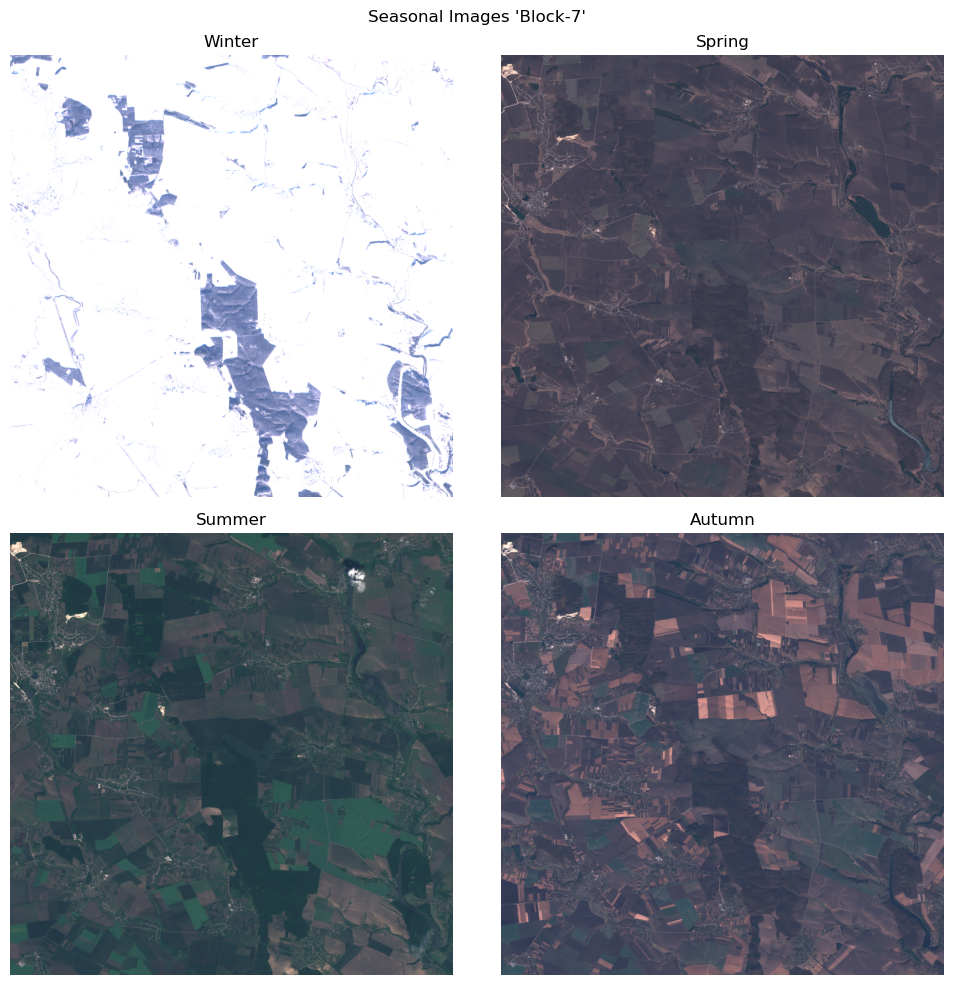

In [47]:
# Plot the received satellite images
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10)) 

block_07_winter_img_prep = corrected_image(block_07_winter_img[0])
block_07_spring_img_prep = corrected_image(block_07_spring_img[0])
block_07_summer_img_prep = corrected_image(block_07_summer_img[0])
block_07_autumn_img_prep = corrected_image(block_07_autumn_img[0])

axes[0, 0].imshow(block_07_winter_img_prep)
axes[0, 0].set_title('Winter')
axes[0, 0].axis('off')

axes[0, 1].imshow(block_07_spring_img_prep)
axes[0, 1].set_title('Spring')
axes[0, 1].axis('off')

axes[1, 0].imshow(block_07_summer_img_prep)
axes[1, 0].set_title('Summer')
axes[1, 0].axis('off')

axes[1, 1].imshow(block_07_autumn_img_prep)
axes[1, 1].set_title('Autumn')
axes[1, 1].axis('off')

plt.suptitle("Seasonal Images 'Block-7'")
plt.tight_layout()

In [48]:
# Request the satellite image block-8 for all four seasons
request_block_08_winter = get_image_block(
    block_bbox=block_08_bbox, 
    block_size=block_08_size, 
    start_date="2018-01-01", 
    end_date="2018-02-01")

request_block_08_spring = get_image_block(
    block_bbox=block_08_bbox, 
    block_size=block_08_size, 
    start_date="2022-03-01", 
    end_date="2022-04-01")

request_block_08_summer = get_image_block(
    block_bbox=block_08_bbox, 
    block_size=block_08_size, 
    start_date="2021-07-01", 
    end_date="2021-08-01")

request_block_08_autumn = get_image_block(
    block_bbox=block_08_bbox, 
    block_size=block_08_size, 
    start_date="2021-10-01", 
    end_date="2021-11-01")

The next four cells below perform requests to Sentinel Hub for each season

In [49]:
block_08_winter_img = request_block_08_winter.get_data()

In [50]:
block_08_spring_img = request_block_08_spring.get_data()

In [51]:
block_08_summer_img = request_block_08_summer.get_data()

In [52]:
block_08_autumn_img = request_block_08_autumn.get_data()

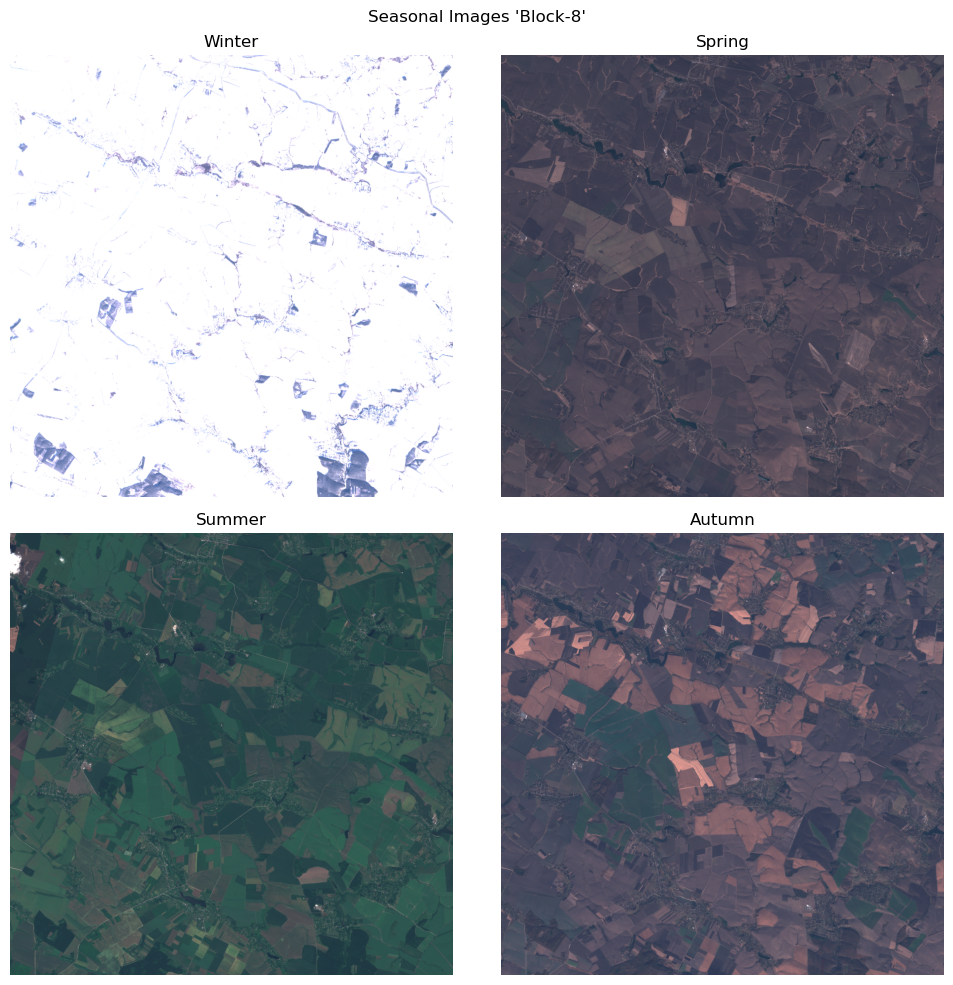

In [53]:
# Plot the received satellite images
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))

block_08_winter_img_prep = corrected_image(block_08_winter_img[0])
block_08_spring_img_prep = corrected_image(block_08_spring_img[0])
block_08_summer_img_prep = corrected_image(block_08_summer_img[0])
block_08_autumn_img_prep = corrected_image(block_08_autumn_img[0])

axes[0, 0].imshow(block_08_winter_img_prep)
axes[0, 0].set_title('Winter')
axes[0, 0].axis('off')

axes[0, 1].imshow(block_08_spring_img_prep)
axes[0, 1].set_title('Spring')
axes[0, 1].axis('off')

axes[1, 0].imshow(block_08_summer_img_prep)
axes[1, 0].set_title('Summer')
axes[1, 0].axis('off')

axes[1, 1].imshow(block_08_autumn_img_prep)
axes[1, 1].set_title('Autumn')
axes[1, 1].axis('off')

plt.suptitle("Seasonal Images 'Block-8'")
plt.tight_layout()

In [54]:
# Request the satellite image block-9 for all four seasons
request_block_09_winter = get_image_block(
    block_bbox=block_09_bbox, 
    block_size=block_09_size, 
    start_date="2018-01-01", 
    end_date="2018-02-01")

request_block_09_spring = get_image_block(
    block_bbox=block_09_bbox, 
    block_size=block_09_size, 
    start_date="2022-03-01", 
    end_date="2022-04-01")

request_block_09_summer = get_image_block(
    block_bbox=block_09_bbox, 
    block_size=block_09_size, 
    start_date="2020-07-01", 
    end_date="2020-08-01")

request_block_09_autumn = get_image_block(
    block_bbox=block_09_bbox, 
    block_size=block_09_size, 
    start_date="2021-10-01", 
    end_date="2021-11-01")

The next four cells below perform requests to Sentinel Hub for each season

In [55]:
block_09_winter_img = request_block_09_winter.get_data()

In [56]:
block_09_spring_img = request_block_09_spring.get_data()

In [57]:
block_09_summer_img = request_block_09_summer.get_data()

In [58]:
block_09_autumn_img = request_block_09_autumn.get_data()

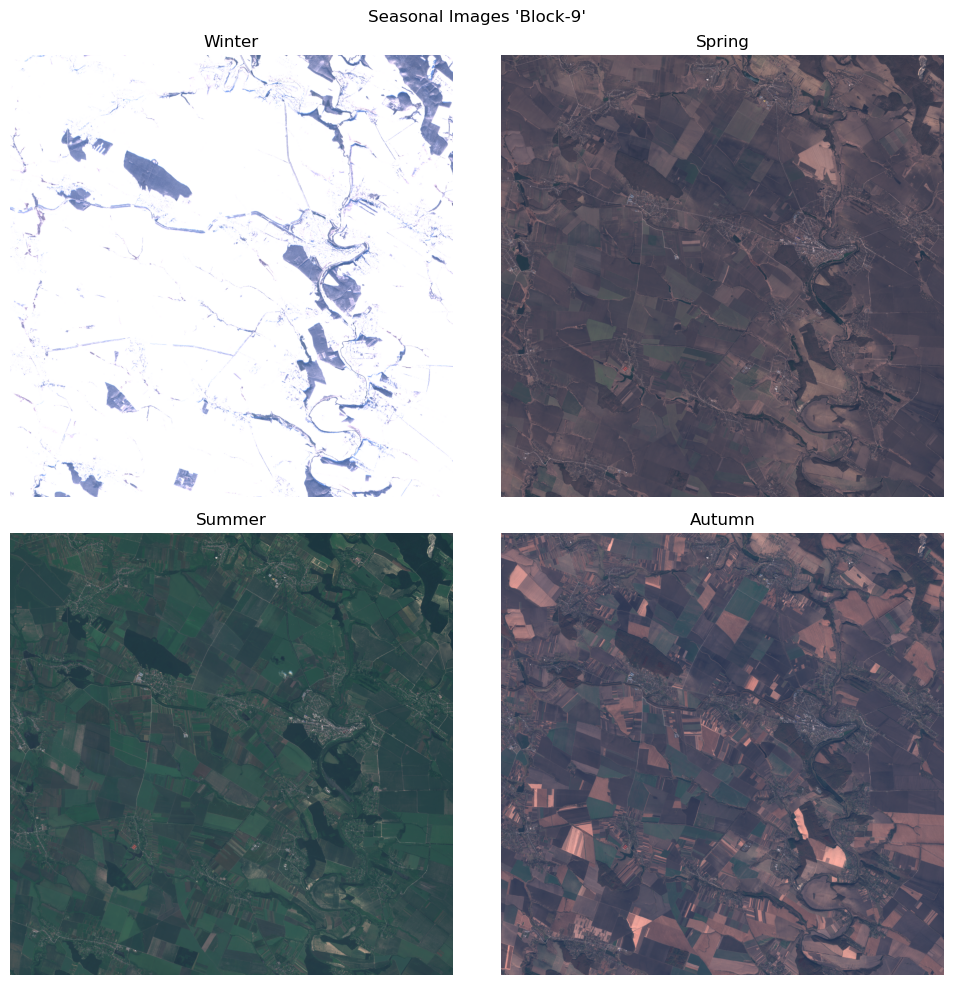

In [59]:
# Plot the received satellite images
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))

block_09_winter_img_prep = corrected_image(block_09_winter_img[0])
block_09_spring_img_prep = corrected_image(block_09_spring_img[0])
block_09_summer_img_prep = corrected_image(block_09_summer_img[0])
block_09_autumn_img_prep = corrected_image(block_09_autumn_img[0])

axes[0, 0].imshow(block_09_winter_img_prep)
axes[0, 0].set_title('Winter')
axes[0, 0].axis('off')

axes[0, 1].imshow(block_09_spring_img_prep)
axes[0, 1].set_title('Spring')
axes[0, 1].axis('off')

axes[1, 0].imshow(block_09_summer_img_prep)
axes[1, 0].set_title('Summer')
axes[1, 0].axis('off')

axes[1, 1].imshow(block_09_autumn_img_prep)
axes[1, 1].set_title('Autumn')
axes[1, 1].axis('off')

plt.suptitle("Seasonal Images 'Block-9'")
plt.tight_layout()

In [60]:
# Request the satellite image block-10 for all four seasons
request_block_10_winter = get_image_block(
    block_bbox=block_10_bbox, 
    block_size=block_10_size, 
    start_date="2018-01-01", 
    end_date="2018-02-01")

request_block_10_spring = get_image_block(
    block_bbox=block_10_bbox, 
    block_size=block_10_size, 
    start_date="2022-03-01", 
    end_date="2022-04-01")

request_block_10_summer = get_image_block(
    block_bbox=block_10_bbox, 
    block_size=block_10_size, 
    start_date="2022-06-01", 
    end_date="2022-07-01")

request_block_10_autumn = get_image_block(
    block_bbox=block_10_bbox, 
    block_size=block_10_size, 
    start_date="2021-10-01", 
    end_date="2021-11-01")

The next four cells below perform requests to Sentinel Hub for each season

In [61]:
block_10_winter_img = request_block_10_winter.get_data()

In [62]:
block_10_spring_img = request_block_10_spring.get_data()

In [63]:
block_10_summer_img = request_block_10_summer.get_data()

In [64]:
block_10_autumn_img = request_block_10_autumn.get_data()

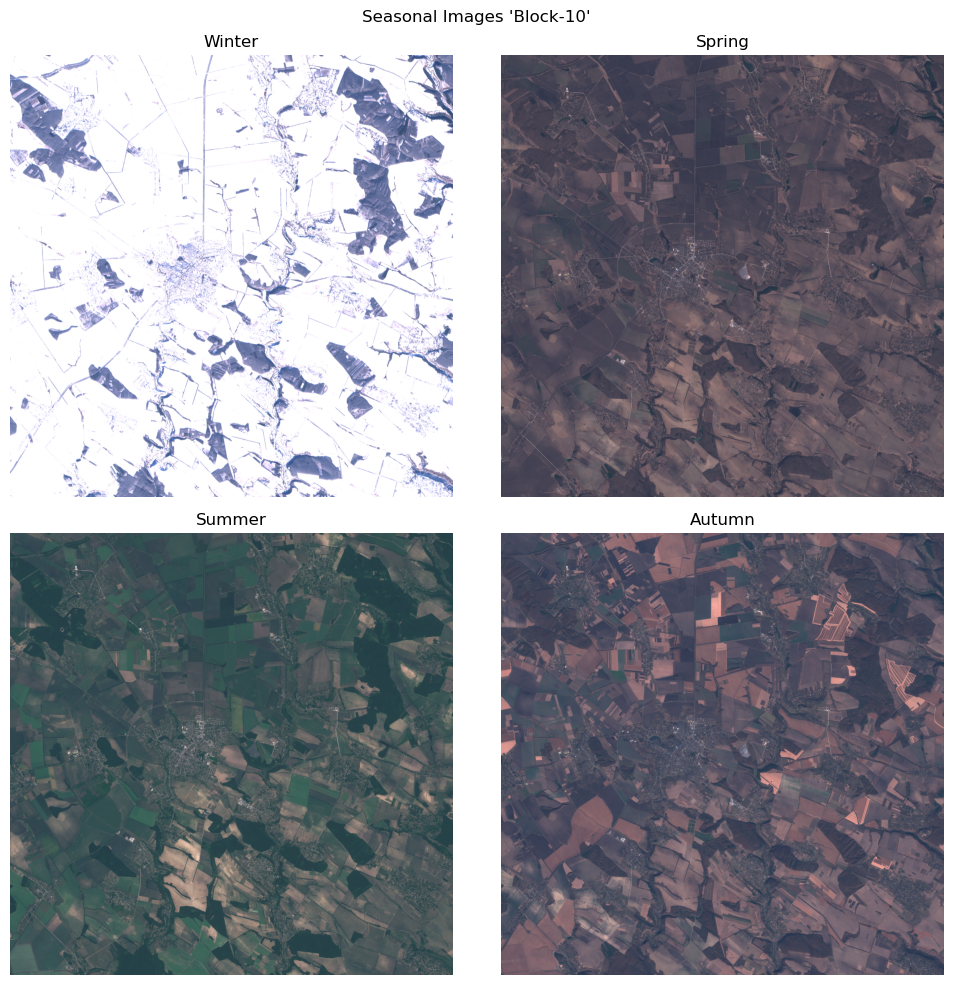

In [65]:
# Plot the received satellite images
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))

block_10_winter_img_prep = corrected_image(block_10_winter_img[0])
block_10_spring_img_prep = corrected_image(block_10_spring_img[0])
block_10_summer_img_prep = corrected_image(block_10_summer_img[0])
block_10_autumn_img_prep = corrected_image(block_10_autumn_img[0])

axes[0, 0].imshow(block_10_winter_img_prep)
axes[0, 0].set_title('Winter')
axes[0, 0].axis('off')

axes[0, 1].imshow(block_10_spring_img_prep)
axes[0, 1].set_title('Spring')
axes[0, 1].axis('off')

axes[1, 0].imshow(block_10_summer_img_prep)
axes[1, 0].set_title('Summer')
axes[1, 0].axis('off')

axes[1, 1].imshow(block_10_autumn_img_prep)
axes[1, 1].set_title('Autumn')
axes[1, 1].axis('off')

plt.suptitle("Seasonal Images 'Block-10'")
plt.tight_layout()

#### Saving the image blocks

In [66]:
# choose save directory
directory_path = 'Sentinel_2_blocks/'

def save_block_as_png(block, block_name, directory_path=directory_path, size=2500):
    """
    Saves a block of image data as a PNG file.

    Arguments:
    - block (numpy.ndarray): Image block represented as a NumPy array.
    - block_name (str): Name of the block to be saved as a PNG file.
    - directory_path (str, optional): Path to the directory where the file will be saved. Defaults to `directory_path`.
    - size (int, optional): Size of the block. Defaults to 2500.

    Notes:
    - The `directory_path` parameter must point to an existing directory or a new directory will be created.
    """
    os.makedirs(directory_path, exist_ok=True)
    block_save = Image.fromarray(block)
    save_path = os.path.join(directory_path, block_name)
    block_save.save(save_path)

In [67]:
# save each block
save_block_as_png(block=block_01_winter_img[0], block_name="Block_01_winter.png")
save_block_as_png(block=block_01_spring_img[0], block_name="Block_01_spring.png")
save_block_as_png(block=block_01_summer_img[0], block_name="Block_01_summer.png")
save_block_as_png(block=block_01_autumn_img[0], block_name="Block_01_autumn.png")
    
save_block_as_png(block=block_02_winter_img[0], block_name="Block_02_winter.png")
save_block_as_png(block=block_02_spring_img[0], block_name="Block_02_spring.png")
save_block_as_png(block=block_02_summer_img[0], block_name="Block_02_summer.png")
save_block_as_png(block=block_02_autumn_img[0], block_name="Block_02_autumn.png")

save_block_as_png(block=block_03_winter_img[0], block_name="Block_03_winter.png")
save_block_as_png(block=block_03_spring_img[0], block_name="Block_03_spring.png")
save_block_as_png(block=block_03_summer_img[0], block_name="Block_03_summer.png")
save_block_as_png(block=block_03_autumn_img[0], block_name="Block_03_autumn.png")
    
save_block_as_png(block=block_04_winter_img[0], block_name="Block_04_winter.png")
save_block_as_png(block=block_04_spring_img[0], block_name="Block_04_spring.png")
save_block_as_png(block=block_04_summer_img[0], block_name="Block_04_summer.png")
save_block_as_png(block=block_04_autumn_img[0], block_name="Block_04_autumn.png")

save_block_as_png(block=block_05_winter_img[0], block_name="Block_05_winter.png")
save_block_as_png(block=block_05_spring_img[0], block_name="Block_05_spring.png")
save_block_as_png(block=block_05_summer_img[0], block_name="Block_05_summer.png")
save_block_as_png(block=block_05_autumn_img[0], block_name="Block_05_autumn.png")
    
save_block_as_png(block=block_06_winter_img[0], block_name="Block_06_winter.png")
save_block_as_png(block=block_06_spring_img[0], block_name="Block_06_spring.png")
save_block_as_png(block=block_06_summer_img[0], block_name="Block_06_summer.png")
save_block_as_png(block=block_06_autumn_img[0], block_name="Block_06_autumn.png")

save_block_as_png(block=block_07_winter_img[0], block_name="Block_07_winter.png")
save_block_as_png(block=block_07_spring_img[0], block_name="Block_07_spring.png")
save_block_as_png(block=block_07_summer_img[0], block_name="Block_07_summer.png")
save_block_as_png(block=block_07_autumn_img[0], block_name="Block_07_autumn.png")
    
save_block_as_png(block=block_08_winter_img[0], block_name="Block_08_winter.png")
save_block_as_png(block=block_08_spring_img[0], block_name="Block_08_spring.png")
save_block_as_png(block=block_08_summer_img[0], block_name="Block_08_summer.png")
save_block_as_png(block=block_08_autumn_img[0], block_name="Block_08_autumn.png")

save_block_as_png(block=block_09_winter_img[0], block_name="Block_09_winter.png")
save_block_as_png(block=block_09_spring_img[0], block_name="Block_09_spring.png")
save_block_as_png(block=block_09_summer_img[0], block_name="Block_09_summer.png")
save_block_as_png(block=block_09_autumn_img[0], block_name="Block_09_autumn.png")
    
save_block_as_png(block=block_10_winter_img[0], block_name="Block_10_winter.png")
save_block_as_png(block=block_10_spring_img[0], block_name="Block_10_spring.png")
save_block_as_png(block=block_10_summer_img[0], block_name="Block_10_summer.png")
save_block_as_png(block=block_10_autumn_img[0], block_name="Block_10_autumn.png")

#### Saving the train, dev and test datasets

In [68]:
def save_images_from_block(image, directory_path, season, start_location, img_format, shift_index, loc_index, start_index=1):
    """
    Saves an image with specified parameters.

    Arguments:
    - image (numpy.ndarray): Image data as a NumPy array.
    - directory_path (str): Path to the directory where images will be saved.
    - season (str): Season identifier for the image.
    - start_location (int): Starting location index.
    - img_format (str): Format of the image file (e.g., 'png', 'jpg').
    - shift_index (int): Index indicating the number of same season.
    - loc_index (int): Index indicating the location.
    - start_index (int, optional): Starting index. Defaults to 1.

    Notes:
    - Saves the image with a specific naming format to the provided directory path.
    """
    path = os.path.join(directory_path,f"location_{int(loc_index+start_index)}")
    os.makedirs(path, exist_ok=True)
    image_winter_pil = Image.fromarray(image)
    save_path = os.path.join(path, f"location_{int(loc_index++start_index)}_{season}_{shift_index}.{img_format}")
    image_winter_pil.save(save_path) 

def create_sub_images_custom(block, subimage_size=250, channels=3):
    """
    Divides a block of image data into sub-images of a specified size.

    Arguments:
    - block (numpy.ndarray): Image block as a NumPy array.
    - subimage_size (int): Size of the sub-images. Defaults to 250.
    - channels (int): Number of color channels. Defaults to 3.

    Returns:
    - sub_images (list): List of sub-images.
    """
    num_subimages_row = block.shape[0] // subimage_size
    num_subimages_col = block.shape[1] // subimage_size
    sub_images = []
    for i in range(num_subimages_row):
        for j in range(num_subimages_col):
            sub_image = block[
                i * subimage_size: (i + 1) * subimage_size,
                j * subimage_size: (j + 1) * subimage_size,
                :
            ]
            sub_images.append(sub_image)
    return sub_images

def create_random_shift_custom(block_list, subimage_size=224):
    """
    Creates randomly shifted sub-images from a list of image blocks.

    Arguments:
    - block_list (list): List of image blocks represented as NumPy arrays.
    - subimage_size (int): Size of the sub-images. Defaults to 224.

    Returns:
    - sub_images_random (list): List of randomly shifted sub-images.
    """
    sub_images_random = []
    for block in block_list:
        if block.shape[0] < subimage_size or block.shape[1] < subimage_size:
            raise ValueError(f"Block dimensions should be at least {subimage_size}.")
        max_row = block.shape[0] - subimage_size
        max_col = block.shape[1] - subimage_size
        start_row = np.random.randint(0, max_row + 1)
        start_col = np.random.randint(0, max_col + 1)
        sub_image = block[
            start_row: start_row + subimage_size,
            start_col: start_col + subimage_size,
            :
        ]
        sub_images_random.append(sub_image)
    return sub_images_random
                    
def process_block_list(blocks_list, 
                       directory_path, 
                       subimage_size_create_sub=250, 
                       subimage_size_random=224,
                       number_of_shifts=4, 
                       start_index=1):
    """
    Processes a list of image blocks by creating sub-images, applying random shifts,
    and saving the resulting images to a directory.

    Arguments:
    - blocks_list (list): List of image blocks represented as NumPy arrays.
    - directory_path (str): Path to the directory where images will be saved.
    - subimage_size_create_sub (int): Size of sub-images during creation. Defaults to 250.
    - subimage_size_random (int): Size of randomly shifted sub-images. Defaults to 224.
    - number_of_shifts (int): Number of random shifts to apply. Defaults to 4.
    - start_index (int): Starting index. Defaults to 1.
    """
    for k in range(number_of_shifts):
        for block_index, block in enumerate(blocks_list):
            sub_images = create_sub_images_custom(block, subimage_size_create_sub)
            sub_images_random = create_random_shift_custom(sub_images, subimage_size_random)
            for loc_index, loc in enumerate(sub_images_random):
                seasons = ['winter', 'spring', 'summer', 'autumn']
                save_images_from_block(
                            image=loc, 
                            directory_path=directory_path, 
                            season=seasons[block_index],
                            start_location=1,
                            img_format="png",
                            shift_index=k,
                            loc_index=loc_index,
                            start_index=start_index)

In [69]:
# Create a lists for process_block_list functionn
block_1_list = [block_01_winter_img[0], block_01_spring_img[0], block_01_summer_img[0], block_01_autumn_img[0]]  
block_2_list = [block_02_winter_img[0], block_02_spring_img[0], block_02_summer_img[0], block_02_autumn_img[0]]  
block_3_list = [block_03_winter_img[0], block_03_spring_img[0], block_03_summer_img[0], block_03_autumn_img[0]]  
block_4_list = [block_04_winter_img[0], block_04_spring_img[0], block_04_summer_img[0], block_04_autumn_img[0]]  
block_5_list = [block_05_winter_img[0], block_05_spring_img[0], block_05_summer_img[0], block_05_autumn_img[0]]  
block_6_list = [block_06_winter_img[0], block_06_spring_img[0], block_06_summer_img[0], block_06_autumn_img[0]]  
block_7_list = [block_07_winter_img[0], block_07_spring_img[0], block_07_summer_img[0], block_07_autumn_img[0]]  
block_8_list = [block_08_winter_img[0], block_08_spring_img[0], block_08_summer_img[0], block_08_autumn_img[0]]  
block_9_list = [block_09_winter_img[0], block_09_spring_img[0], block_09_summer_img[0], block_09_autumn_img[0]]  
block_10_list = [block_10_winter_img[0], block_10_spring_img[0], block_10_summer_img[0], block_10_autumn_img[0]]  

In [70]:
# Save the prepared train, dev and test datasets
directory_path_train = r"Sentinel_2_dataset/train"
directory_path_dev = r"Sentinel_2_dataset/dev"
directory_path_test = r"Sentinel_2_dataset/test"

process_block_list(blocks_list=block_1_list, directory_path=directory_path_train, start_index=1)
process_block_list(blocks_list=block_2_list, directory_path=directory_path_train, start_index=101)
process_block_list(blocks_list=block_3_list, directory_path=directory_path_train, start_index=201)
process_block_list(blocks_list=block_4_list, directory_path=directory_path_train, start_index=301)
process_block_list(blocks_list=block_5_list, directory_path=directory_path_train, start_index=401)
process_block_list(blocks_list=block_6_list, directory_path=directory_path_train, start_index=501)
process_block_list(blocks_list=block_7_list, directory_path=directory_path_train, start_index=601)
process_block_list(blocks_list=block_8_list, directory_path=directory_path_train, start_index=701)

process_block_list(blocks_list=block_9_list, directory_path=directory_path_dev, start_index=801)

process_block_list(blocks_list=block_10_list, directory_path=directory_path_test, start_index=901)